# 1 - Loading Libraries and Data Set

In [1]:
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plot_style

import warnings
from statsmodels.tools.sm_exceptions import InterpolationWarning
warnings.filterwarnings('ignore') # InterpolationWarning appears while applying KPSS test.

print("It is good to go, lift off chief.")

It is good to go, lift off chief.


In [2]:
df = pd.read_csv('Data/rossmann_cleaned.csv', 
                    parse_dates=['Date']
                   )

df['date_parsed'] = df['Date'].copy()

In [3]:
df.head()#.tail()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,Promo2,...,Assortment_c,StateHoliday_0,StateHoliday_a,StateHoliday_b,StateHoliday_c,StoreType_a,StoreType_b,StoreType_c,StoreType_d,date_parsed
0,1,5,2015-07-31,5263,555,1,1,1,1270.0,0,...,0,1,0,0,0,0,0,1,0,2015-07-31
1,2,5,2015-07-31,6064,625,1,1,1,570.0,1,...,0,1,0,0,0,1,0,0,0,2015-07-31
2,3,5,2015-07-31,8314,821,1,1,1,14130.0,1,...,0,1,0,0,0,1,0,0,0,2015-07-31
3,4,5,2015-07-31,13995,1498,1,1,1,620.0,0,...,1,1,0,0,0,0,0,1,0,2015-07-31
4,5,5,2015-07-31,4822,559,1,1,1,29910.0,0,...,0,1,0,0,0,1,0,0,0,2015-07-31


In [4]:
# Since Pandas' default notation is scientific, it is required convert scientific notation to float.
pd.options.display.float_format = '{:.2f}'.format

df.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,Promo2,Assortment_a,Assortment_b,Assortment_c,StateHoliday_0,StateHoliday_a,StateHoliday_b,StateHoliday_c,StoreType_a,StoreType_b,StoreType_c,StoreType_d
count,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00,1017209.00
mean,558.43,4.00,5773.82,633.15,0.83,0.38,0.18,5422.02,0.50,0.53,0.01,0.46,0.97,0.02,0.01,0.00,0.54,0.02,0.13,0.31
std,321.91,2.00,3849.93,464.41,0.38,0.49,0.38,7706.92,0.50,0.50,0.09,0.50,0.17,0.14,0.08,0.06,0.50,0.12,0.34,0.46
min,1.00,1.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,280.00,2.00,3727.00,405.00,1.00,0.00,0.00,710.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,558.00,4.00,5744.00,609.00,1.00,0.00,0.00,2325.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
75%,838.00,6.00,7856.00,837.00,1.00,1.00,0.00,6880.00,1.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00
max,1115.00,7.00,41551.00,7388.00,1.00,1.00,1.00,75860.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [5]:
df.columns

Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'Assortment_a',
       'Assortment_b', 'Assortment_c', 'StateHoliday_0', 'StateHoliday_a',
       'StateHoliday_b', 'StateHoliday_c', 'StoreType_a', 'StoreType_b',
       'StoreType_c', 'StoreType_d', 'date_parsed'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 22 columns):
 #   Column               Non-Null Count    Dtype         
---  ------               --------------    -----         
 0   Store                1017209 non-null  int64         
 1   DayOfWeek            1017209 non-null  int64         
 2   Date                 1017209 non-null  datetime64[ns]
 3   Sales                1017209 non-null  int64         
 4   Customers            1017209 non-null  int64         
 5   Open                 1017209 non-null  int64         
 6   Promo                1017209 non-null  int64         
 7   SchoolHoliday        1017209 non-null  int64         
 8   CompetitionDistance  1017209 non-null  float64       
 9   Promo2               1017209 non-null  int64         
 10  Assortment_a         1017209 non-null  int64         
 11  Assortment_b         1017209 non-null  int64         
 12  Assortment_c         1017209 non-null  int64         
 1

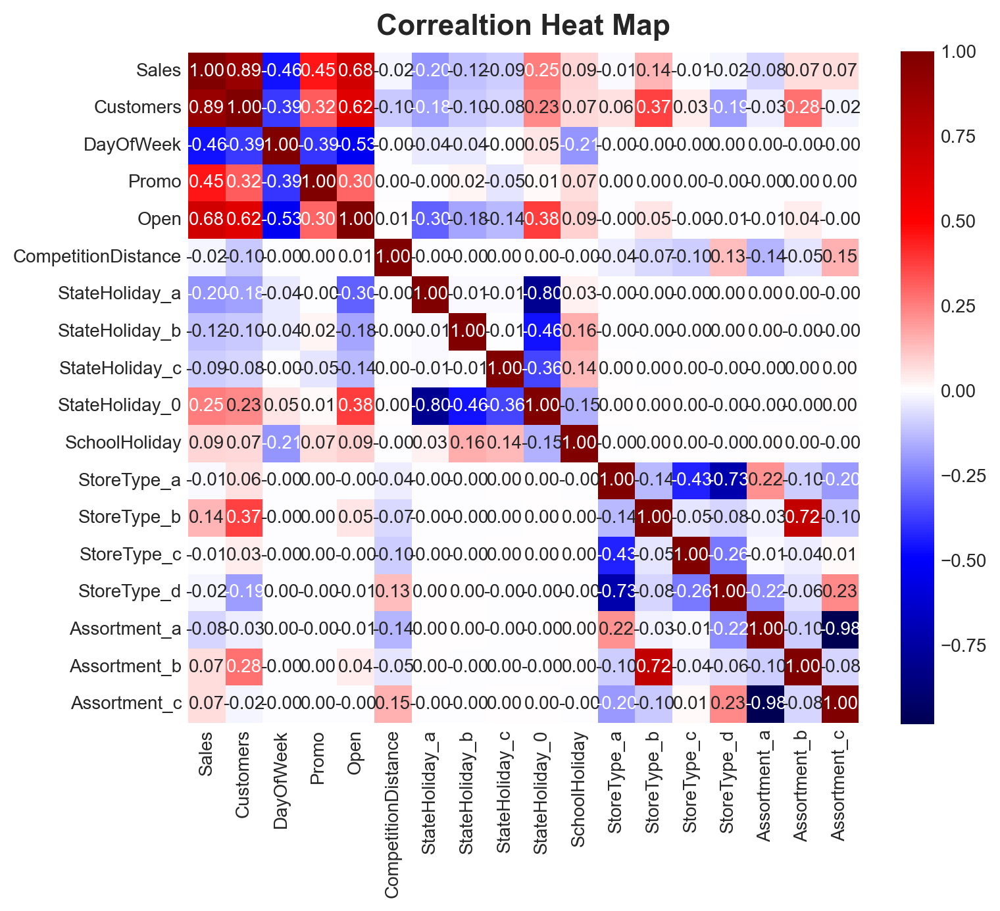

In [7]:
features = df[['Sales','Customers','DayOfWeek','Promo','Open', 'CompetitionDistance',
                 'StateHoliday_a','StateHoliday_b','StateHoliday_c','StateHoliday_0', 'SchoolHoliday',
                 'StoreType_a','StoreType_b','StoreType_c','StoreType_d',
                 'Assortment_a','Assortment_b','Assortment_c']
                ]
correlation = features.corr()

f, ax = plt.subplots(figsize = (8,8))
sns.heatmap(correlation, cbar = True, cbar_kws={"shrink": 0.71}, square = True, annot=True, fmt= '.2f', annot_kws={'size': 10},
           ax = ax, cmap= 'seismic', center=0.00).set(title='Correaltion Heat Map')
plt.show()

It is worth checking mutual information to detect more than linear relationships between the target and features.

In [8]:
%%time
from utils import make_mi_scores
X_mi = features.copy()
y_mi = X_mi.pop("Sales")

# Label encoding for categoricals
for colname in X_mi.select_dtypes("object"):
    X_mi[colname], _ = X_mi[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X_mi.dtypes == int

mi_scores = make_mi_scores(X_mi, y_mi, discrete_features)
mi_scores#[::3]

Wall time: 5min 12s


Customers             1.03
Open                  0.45
DayOfWeek             0.35
CompetitionDistance   0.20
Promo                 0.13
StateHoliday_0        0.05
StateHoliday_a        0.03
StateHoliday_b        0.01
Assortment_a          0.01
StateHoliday_c        0.01
StoreType_d           0.01
StoreType_b           0.01
Assortment_c          0.01
StoreType_a           0.00
SchoolHoliday         0.00
Assortment_b          0.00
StoreType_c           0.00
Name: MI Scores, dtype: float64

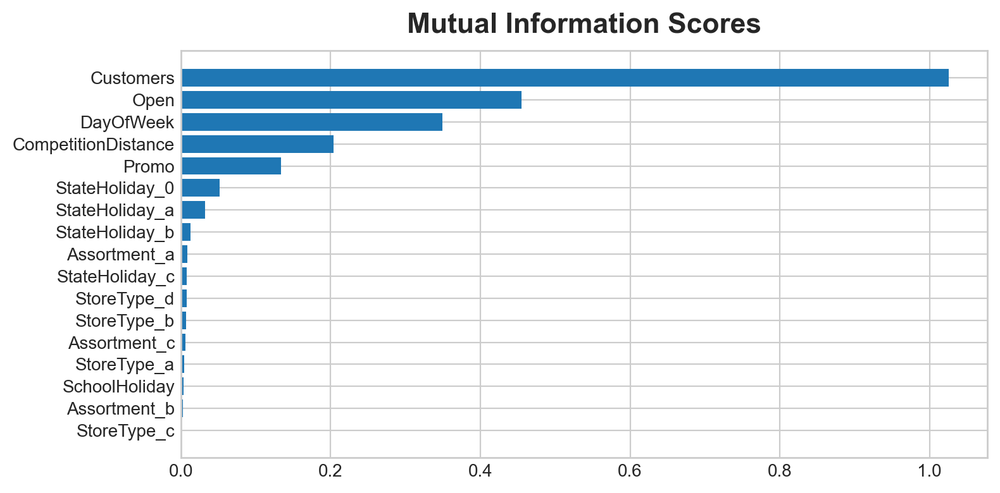

In [9]:
from utils import plot_mi_scores
plt.figure(dpi=100, figsize=(8, 4))
plot_mi_scores(mi_scores);

Distribution of categorical data.

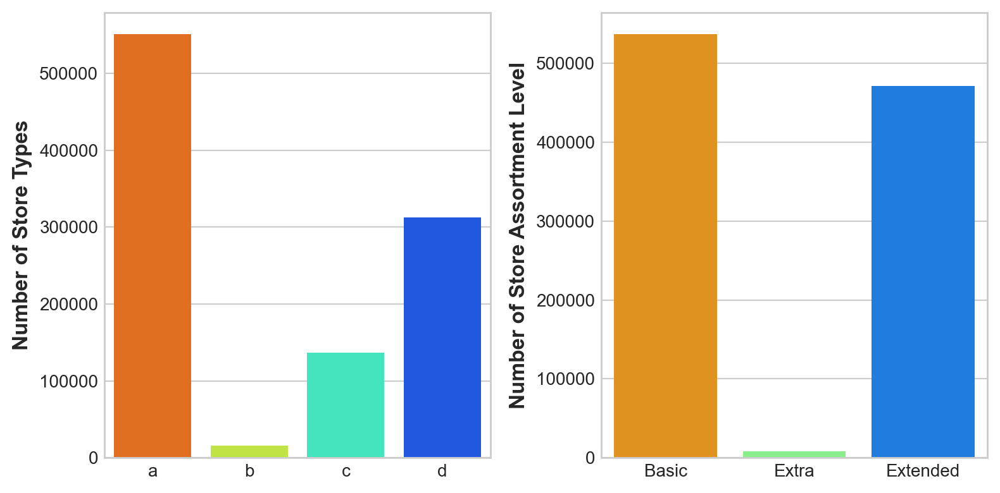

In [10]:
StoreTypes = pd.Series(data=[df['StoreType_a'].sum(),df['StoreType_b'].sum(),df['StoreType_c'].sum(),df['StoreType_d'].sum()], 
                       index= ['a', 'b', 'c', 'd'],
                       name= 'Number of Store Types')

Assortments = pd.Series(data=[df['Assortment_a'].sum(),df['Assortment_b'].sum(),df['Assortment_c'].sum()], 
                       index= ['Basic', 'Extra', 'Extended'],
                       name= 'Number of Store Assortment Level')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (8,4))
sns.barplot(x=StoreTypes.index, y=StoreTypes, palette='jet_r',ax=ax1);

sns.barplot(x=Assortments.index, y=Assortments, palette='jet_r',ax=ax2);

Recall that the data set is consist of 1115 individual stores, so the graphs above do not represent the data set accurately but they are still enough to give us some idea.\
We will see the distribution of store types and assortment clearly when we will make the EDA of store-specific sales.

Distribution of numerical data.

**NOTE:** `'Customers'` data is overwhelmed by `'0'` valued entries, for sake of visual observabillity I excluded entries with `'0'` values.

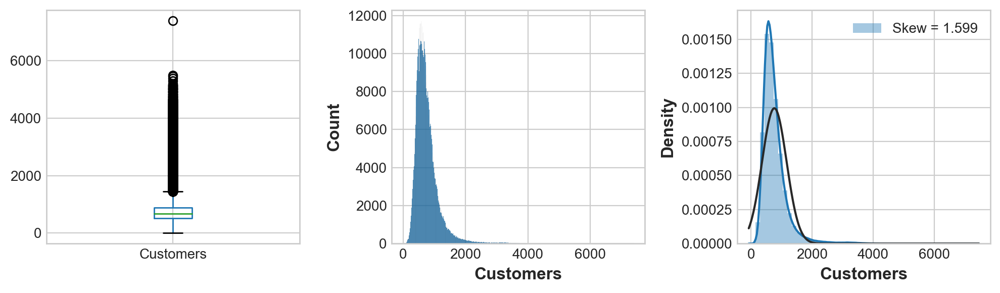

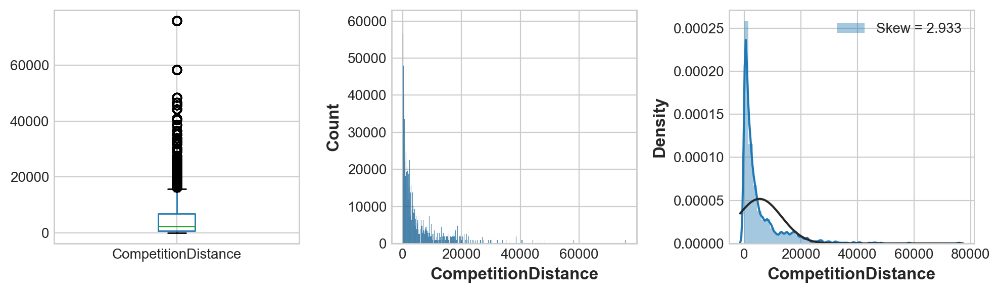

In [11]:
from scipy import stats

continuous_feats = ['Customers','CompetitionDistance']

for feat in df[continuous_feats]:
    fig, ax = plt.subplots(1,3,figsize=(10,3))
    skew = df[feat].skew()
    
    df.loc[df[feat].ne(0)].boxplot(feat, ax=ax[0])
    sns.histplot(df[feat].loc[df[feat].ne(0)], ax=ax[1])
    sns.distplot(df[feat].loc[df[feat].ne(0)], ax=ax[2],  fit=stats.norm, label = 'Skew = %.3f' %(skew))
    
    plt.legend(loc='best')
    plt.show()

In the graphs above, both `'Customers'` and `'CompetitionDistance'` have extremely high outliers.\
Since `'df'` data set is not grouped by the individual stores, occurance of such anomalities is reasonable.\
The distribution of `'Customers'` and `'CompetitionDistance'` also will be clear during making the EDA of store-specific sales.

# 2 - On pursuit of country-wise (Germany) patterns

In this section, we will define time series-related patterns, i.e. the trend, seasonality, and cycles.
The time series patterns are explored and determined via eyeballing and statistical tools.

Components one should search in a regular time series are:
- Trend
- Seasonality
- Cycles
- The random (irregular) component, also known as (irreducible) Error

To achieve the random component, we need to learn each component and subtract them from the series sequentially. The iterative process is defined as follows;
- First, learn the trend, and subtract it from the series,
- Then learn the seasonality from the detrended series, and subtract the seasons out,
- Finally, learn the cyclic behaviour from the detrended and deseasoned series using lags and leads, and subtract the cycles.

At the end of the process, we will be left with the unpredictable error. It is essential to make our time series stationary, free from trend and seasonality components, for predictions and forecasting.
Let's keep it simple and analyse the average sales of all stores country-wise while pursuing a pattern.

In [12]:
store_sales = df.set_index('date_parsed').to_period('D')
store_sales = store_sales.set_index(['Store'], append=True)
average_sales_DE = store_sales.groupby('Date').mean()['Sales'].to_frame()
average_sales_DE.head()

,Sales
Date,
2013-01-01,87.28
2013-01-02,6233.03
2013-01-03,5693.11
2013-01-04,5954.22
2013-01-05,5337.75


In [13]:
average_sales_DE.describe().T

,count,mean,std,min,25%,50%,75%,max
Sales,942.00,5782.70,2888.46,87.28,5321.41,6036.15,7530.91,14012.15


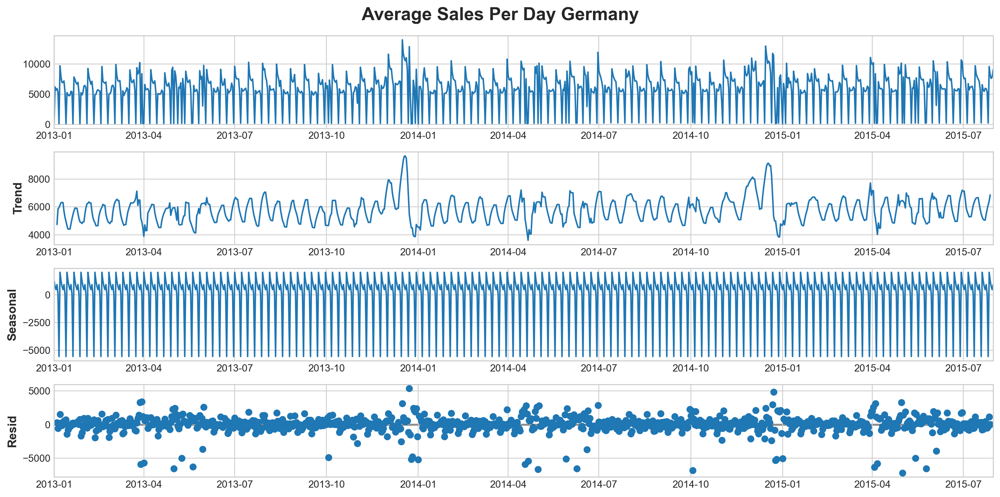

In [14]:
from utils import seasonal_decompose
seasonal_decompose(average_sales_DE, title="Average Sales Per Day Germany");

Eyeballing the graphs above hints that existence of a trend is obscure but most porbably there is seasonality.

## 2.1 - Identifying and Determining the trend

### 2.1.1 - Moving average plot

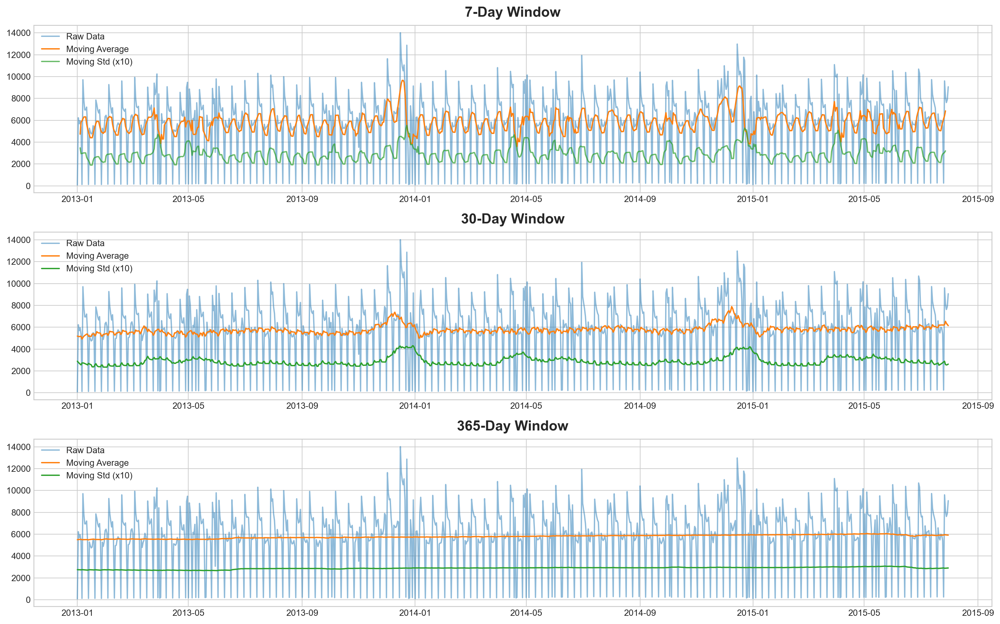

In [15]:
#pd.options.display.float_format = '{:.8f}'.format
from tsa_plots import analyze_stationarity
analyze_stationarity(average_sales_DE['Sales'], 'Raw Data')

### 2.1.2 - Linear regression (OLS)

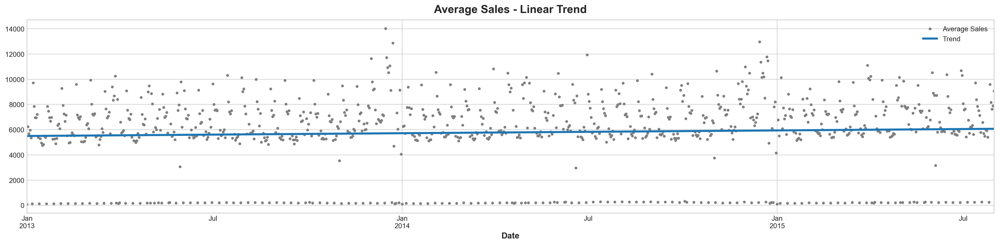

In [16]:
from statsmodels.tsa.deterministic import DeterministicProcess

dp = DeterministicProcess(
    index=average_sales_DE.index,  # dates from the training data
    constant=True,                 # dummy feature for the bias (y_intercept)
    order=1,                       # the time dummy (trend)
    drop=True,                     # drop terms if necessary to avoid collinearity
)
# `in_sample` creates features for the dates given in the `index` argument
X = dp.in_sample()

from sklearn.linear_model import LinearRegression

y = average_sales_DE["Sales"]  # the target

# The intercept is the same as the `const` feature from DeterministicProcess. 
# LinearRegression behaves badly with duplicated features, so we need to be sure to exclude it here.
model = LinearRegression(fit_intercept=False)
model.fit(X, y)

y_pred = pd.Series(
    model.predict(X), 
    index=X.index,
    name='Fitted',
)

ax = average_sales_DE['Sales'].plot(style=".", color="0.5", title="Average Sales - Linear Trend", label = "Average Sales")
_ = y_pred.plot(ax=ax, linewidth=3, label="Trend", figsize = ((20,5)))
ax.legend();

### 2.1.3 - Inspection of ACF correlogram

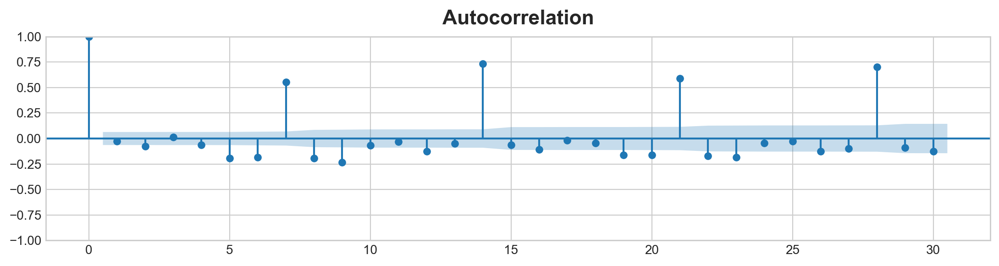

In [17]:
from statsmodels.graphics.tsaplots import plot_acf
plt.rc("figure", autolayout=True, figsize=(11, 3))
plot_acf(average_sales_DE, lags=30);

Eyeballing suggests that there is barely a trend and the AFC correlogram implies that the series is non-stationary due to seasonality rather a trend. The existence of the trend might be insignificant.

Let's apply unit root tests and see the significance level of the trend.

### 2.1.4 - Unit Root Tests


A unit root test is a statistical test for the proposition (null hypothesis) of whether an autoregressive statistical model of a time series, the autoregressive parameter, is unity or not.
Augmented Dickey-Fuller Test (ADF) is the most used unit root test, but one should know that ADF tests do not perform well with structural breaks*.
ADF tests also have little power to distinguish between trend-stationary and difference-stationary (unit root) processes, so ADF tests might not be enough to determine the type of the trend, whether it is deterministic (trend-stationary) or stochastic (difference-stationary) so one should include Kwiatkowski-Phillips-Schmidt-Shin (KPSS) stationarity tests and interpret the combination of results.

\*Some unit root tests that allow for structural breaks are Zivot-Andrews test and Clemente-Montanes-Reyes test.

In [18]:
from statsmodels.tsa.stattools import (kpss, adfuller)# , zivot_andrews)

adf_p  = adfuller(average_sales_DE['Sales'], autolag='AIC')[1]  # H0: The series contains a unit root. -> TS is NON-stationary
kpss_p = kpss(average_sales_DE['Sales'], regression='c')[1]     # H0: The series is stationary around a constant. -> TS is stationary, TS does NOT contains a unit root.

print(" ADF p-value  : %.10f \n" %adf_p,
      "KPSS p-value : %.4f \n" %kpss_p,)

 ADF p-value  : 0.0000009870 
 KPSS p-value : 0.0171 



There are four possible outcomes of ADF and KPSS tests. Each one results with a different outcome. 

> - Case 1: Both tests conclude that the series is not stationary - The series is not stationary
>- Case 2: Both tests conclude that the series is stationary - The series is stationary
>- Case 3: KPSS indicates stationarity (a unit root does NOT exist in TS) and ADF indicates non-stationarity - The series is trend stationary.\
Trend needs to be removed to make series strict stationary.\
The detrended series is checked for stationarity.
>- Case 4: KPSS indicates non-stationarity (a unit root exists in TS) and ADF indicates stationarity - The series is difference stationary.\
Differencing is to be used to make series stationary.\
The differenced series is checked for stationarity.

ADF test result implies that the series is stationary but contradictly KPSS test catched that the series is not *"trend"* stationary.\
The results of KPSS and ADF tests fall into `Case 4`, so the series is difference stationary and we should better apply differencing before de-seasoning and forecasting.

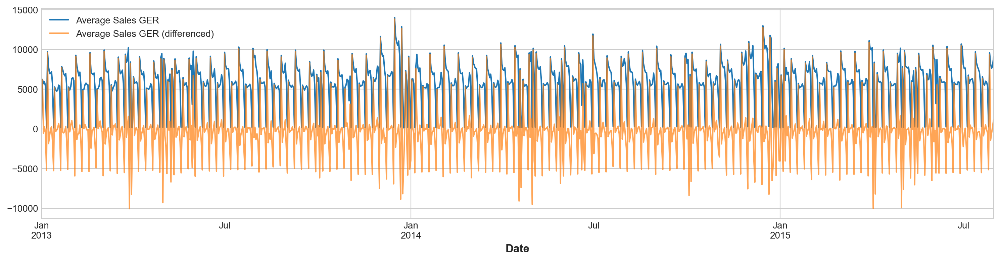

In [19]:
y_differenced = pd.DataFrame(average_sales_DE['Sales'].diff(1).dropna())

average_sales_DE['Sales'].plot(legend=True, label='Average Sales GER',  figsize=(15, 4));
y_differenced['Sales'].plot(legend=True, label='Average Sales GER (differenced)', alpha=0.7);

In [20]:
adf_p  = adfuller(y_differenced['Sales'], autolag='AIC')[1]  # H0: The series contains a unit root. -> TS is NON-stationary
kpss_p = kpss(y_differenced['Sales'], regression='c')[1]     # H0: The series is stationary around a constant. -> TS is stationary, TS does NOT contains a unit root.

print(" ADF p-value  : %.10f \n" %adf_p,
      "KPSS p-value : %.4f \n" %kpss_p,)

 ADF p-value  : 0.0000000000 
 KPSS p-value : 0.1000 



The URTs' results show us that first order (`.diff(1)`) differencing is effective to tackle the existing trend.

## 2.2 - Checking The Seasonality

Previously the trend has been extracted by differencing. Below we will inspect the existence of seasonality.

### 2.2.1 - Seasonality plot

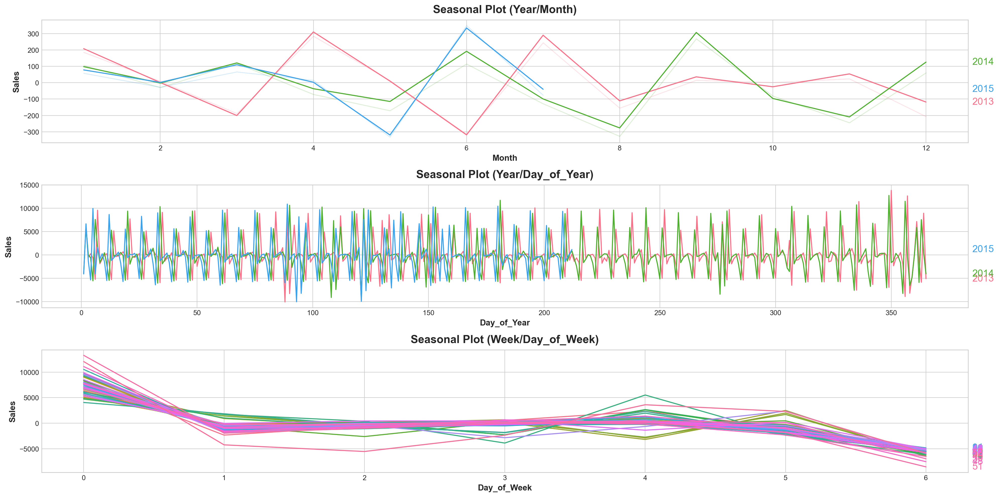

In [21]:
from tsa_plots import seasonal_plot

X = y_differenced.copy()

# months within a year
X["Month"] = X.index.month

X["Week"] = X.index.week
X['Day_of_Week'] = X.index.dayofweek

# days within a year
X["Day_of_Year"] = X.index.dayofyear
X["Year"] = X.index.year

fig, (ax1, ax2, ax3) = plt.subplots(3, 1,figsize=(20, 10))

seasonal_plot(X, y='Sales', period="Year", freq='Month', ax=ax1)
seasonal_plot(X, y='Sales', period="Year", freq="Day_of_Year", ax=ax2)
seasonal_plot(X, y='Sales', period="Week", freq="Day_of_Week", ax=ax3);

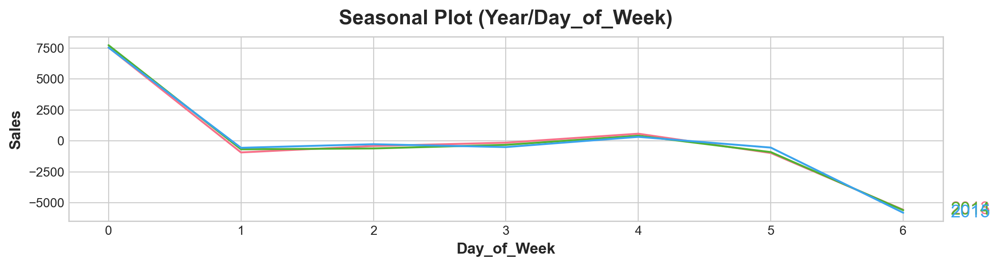

In [22]:
X_DayOfWeek = X.groupby(['Year', 'Day_of_Week']).agg({'Sales':'mean'}) # alernative -> X_DayOfWeek = X.groupby(['Year', 'Day_of_Week']).mean()['Sales'].to_frame()
X_DayOfWeek['Day_of_Week'] = 3*[0,1,2,3,4,5,6]
X_DayOfWeek["Year"] = [2013,2013,2013,2013,2013,2013,2013,2014,2014,2014,2014,2014,2014,2014,2015,2015,2015,2015,2015,2015,2015]

seasonal_plot(X_DayOfWeek, y='Sales', period="Year", freq='Day_of_Week');

Eyeballing on the middle chart, `'Seasonal Plot (Year/Day_of_Year)'`, indicates an additive seasonality with no trend, possibly a weekly or (due to the double spikes) a semi-weekly season. Demand within a week is particularly highest on mondays and fridays respectively.\
Since vast majority of the shops are closed during sundays, the demand is lowest on sundays as seen on the bottom charts, `'Seasonal Plot (Week/Day_of_Week)'` and `'Seasonal Plot (Year/Day_of_Week)'`.

To determine the most useful sesonality period we should check the correlogram and the periodogram.

### 2.2.2 - Inspection of ACF correlogram

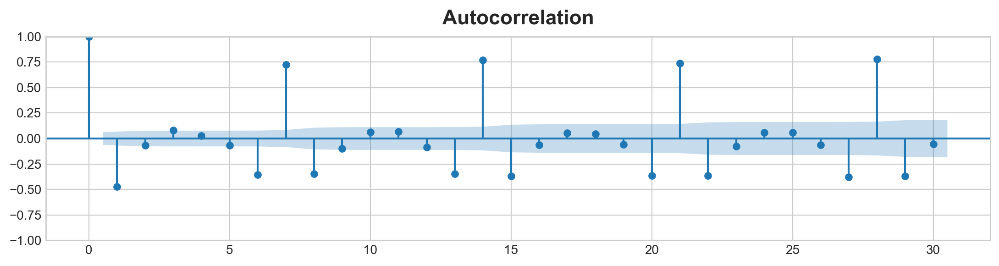

In [23]:
plot_acf(y_differenced);

The plot of autocorrelation of total sales with 30 lags has negative spikes in every 1st, 6th, and positive spike in every 7th lag.\
Drastic increases on Mondays following drastic decreases on Sundays and relatively mild increases on Fridays.\
These foundings imply weekly seasonality. Our findings from the AFC correlogram are on par with the seasonal plots above. 

### 2.2.3 - Fourier Features and the Periodogram

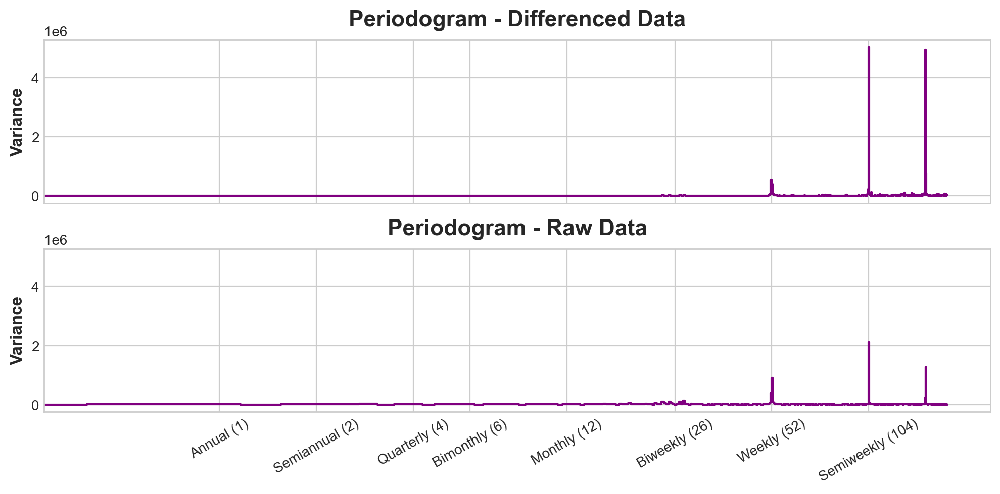

In [24]:
from tsa_plots import plot_periodogram

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 5))
ax1 = plot_periodogram(y_differenced['Sales'], ax=ax1)
ax1.set_title("Periodogram - Differenced Data")
ax2 = plot_periodogram(average_sales_DE.Sales, ax=ax2);
ax2.set_title("Periodogram - Raw Data");

Periodogram confirms the presence of weekly seasonality as seen in the ACF correlogam. The evidence of a semi-weekly season is far stronger than a weekly season. In terms of business days in Germany this makes sense since vast majority of the shops are closed on Sundays and the correlogram implies that people are tend to do shopping on the first day of the week and/or the day before weekend.

## 2.3 - Investigating the cycles

To determine the cyclic behaviour, we need isolate the cycles by deseasonalising the detrended series.

### 2.3.1 - Deseasoning

Since the `DeterministicProcess` handles the weekly seasonality and there is not any trace/evidence of monthly or yearly/annual seasonality, there is no need to include Fourier pairs into the process.

In [25]:
from statsmodels.tsa.deterministic import (DeterministicProcess, # to create indicators
                                           CalendarFourier)      # to create fourier features as additional terms
from sklearn.linear_model import LinearRegression

# fourier = CalendarFourier(freq='A', order=2)

# determine the target
y = y_differenced['Sales']

# create a feature set
dp = DeterministicProcess(
    index=y.index,
    constant=True,   # dummy feature for bias (y-intercept)
    seasonal= True,  # seasonal features, weekly seasonality (seasonal indicators)
    drop=True,       # drop terms to avoid collinearity
    #additional_terms=[fourier], # fourier features, annual seasonality
)
X = dp.in_sample()

model = LinearRegression(fit_intercept=False)
model.fit(X, y)

y_pred = pd.Series(
    model.predict(X), 
    index=X.index,
    name='Fitted',
)

y_deseasoned = y - y_pred

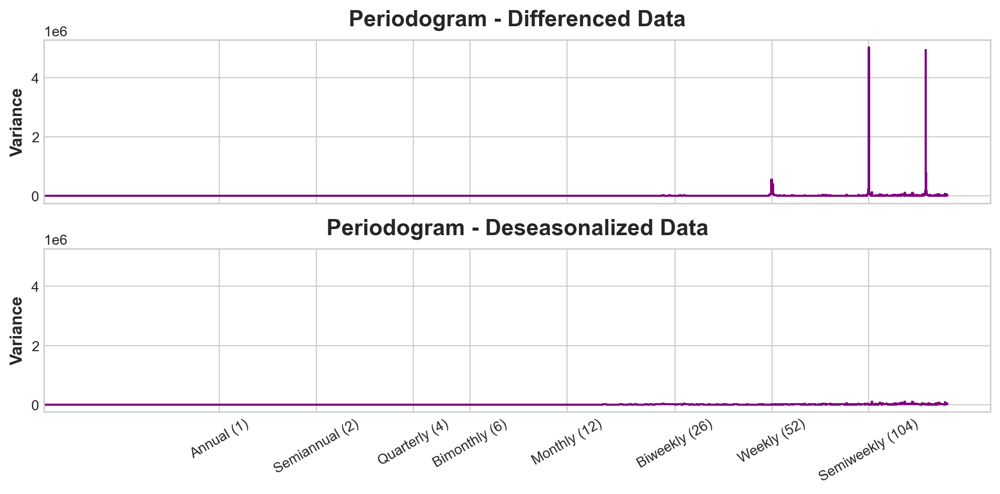

In [26]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 5))
ax1 = plot_periodogram(y, ax=ax1)
ax1.set_title("Periodogram - Differenced Data")
ax2 = plot_periodogram(y_deseasoned, ax=ax2);
ax2.set_title("Periodogram - Deseasonalized Data");

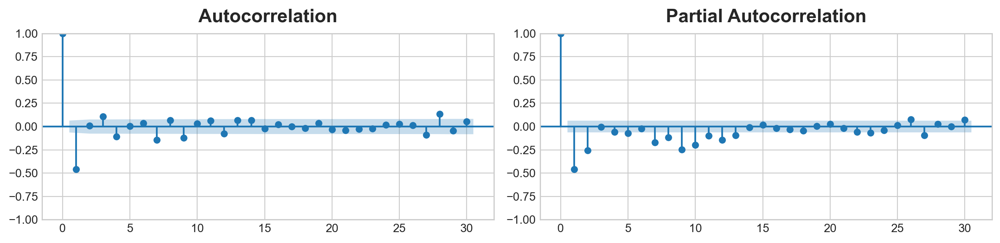

In [27]:
from statsmodels.graphics.tsaplots import plot_pacf

fig, ax = plt.subplots(1,2,figsize=(12,3))
plot_acf(y_deseasoned, lags=30, ax=ax[0]);
plot_pacf(y_deseasoned, lags=30, ax=ax[1]);

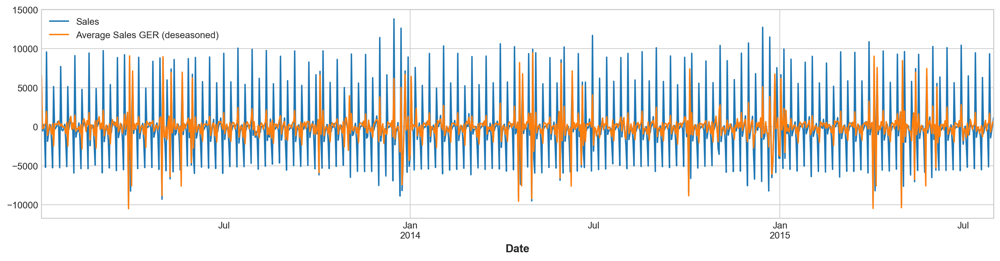

In [28]:
y_differenced.plot(legend=True, label='Average Sales GER (differenced)',  figsize=(15, 4))
y_deseasoned.plot(legend=True, label='Average Sales GER (deseasoned)');

It looks like the series is somehow deseasonalized in terms of weekly seasonality, the remaining flactuation (orange line) is most likely originated from cyclic behaviour and/or other seasonal effects such as national holidays or periodical promotions.\
Recall that each store's promotion details are given in the data set, we will use them later.

Some holidays are regional and differ from state to state i.e. southern states celebrates more religious holidays than northern states.\
We should better check how many stores are closed in which regional holidays.

In [29]:
# State specific/regional holidays
nation_wide_holidays = df.loc[(df.StateHoliday_a == 1)| # State specific holidays
                              (df.StateHoliday_b == 1)| # Easter Holidays
                              (df.StateHoliday_c == 1)  # Christmas Holidays
                          ].Date.value_counts()
nation_wide_holidays.sort_index()

2013-01-01    1114
2013-01-06     309
2013-03-29    1115
2013-04-01    1115
2013-05-01    1115
2013-05-09    1115
2013-05-20    1115
2013-05-30     766
2013-08-15     180
2013-10-03    1115
2013-10-31     167
2013-11-01     579
2013-11-20      75
2013-12-25    1115
2013-12-26    1115
2014-01-01    1115
2014-01-06     309
2014-04-18    1115
2014-04-21    1115
2014-05-01    1115
2014-05-29    1115
2014-06-09    1115
2014-06-19     766
2014-10-03     935
2014-10-31     167
2014-11-01     399
2014-11-19      75
2014-12-25     935
2014-12-26     935
2015-01-01    1079
2015-01-06     309
2015-04-03    1115
2015-04-06    1115
2015-05-01    1115
2015-05-14    1115
2015-05-25    1115
2015-06-04     766
Name: Date, dtype: int64

Let's extract the dates when more than 500 stores are closed due to national or regional holidays at the same day.

Below is a manually arranged list; 
- 2013-01-01 data is excluded since it has been extracted while differencing.
- 2015-01-06 data is included though it is lower that 500 due to the lack of data from store in Saarland (SL) state.\
    I discovered that at some point stores in SL decided not to send any data while their stores are closed.

In [30]:
%%time
nationWideHolidayList = [             '2013-03-29','2013-04-01','2013-05-01','2013-05-09','2013-05-20','2013-05-30','2013-10-03','2013-11-01','2013-12-25','2013-12-26',
                         '2014-01-01','2014-04-18','2014-04-21','2014-05-01','2014-05-29','2014-06-09','2014-06-19','2014-10-03','2014-11-01','2014-12-25','2014-12-26',
                         '2015-01-01','2015-04-03','2015-04-06','2015-05-01','2015-05-14','2015-05-25','2015-06-04']
df['National_Holiday'] = 0
for date in range(len(nationWideHolidayList)):
    df.loc[df['Date'] == nationWideHolidayList[date], 'National_Holiday'] = 1

Wall time: 104 ms


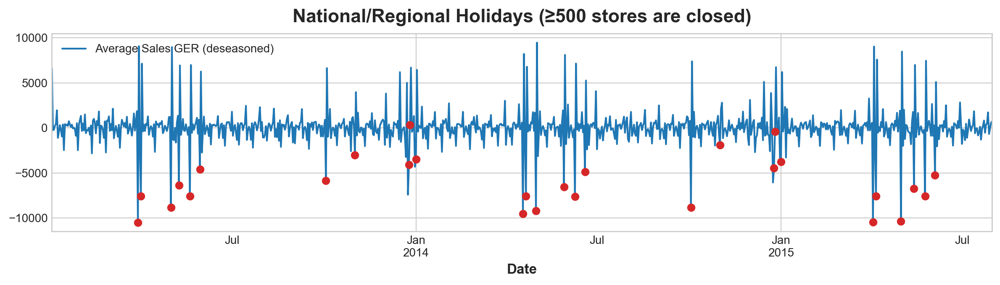

In [31]:
national_holidays = df.loc[(df.National_Holiday == 1)].Date.value_counts().sort_index().to_frame()

ax = y_deseasoned.plot(legend=True, label='Average Sales GER (deseasoned)', figsize=(12, 3.5))
plt.plot_date(national_holidays.index, y_deseasoned[national_holidays.index], color='C3')
ax.set_title('National/Regional Holidays (≥500 stores are closed)');

While we are on it, let's check the promotion days.

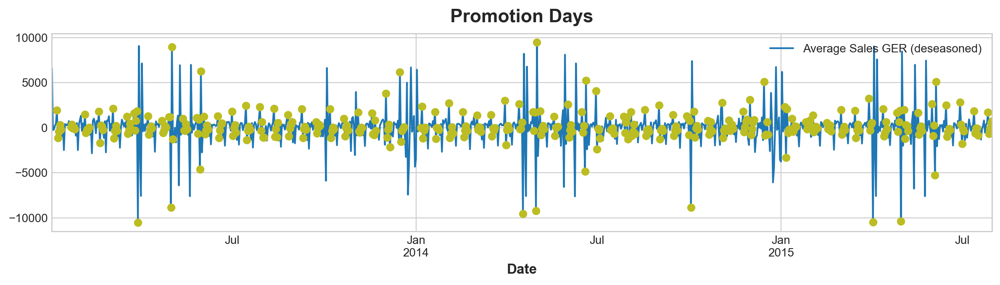

In [32]:
# Promotion days
promos = df.loc[(df.Promo == 1)].Date.value_counts().sort_index().to_frame()

ax = y_deseasoned.plot(legend=True, label='Average Sales GER (deseasoned)', figsize=(12, 3.5))
plt.plot_date(promos.index, y_deseasoned[promos.index], color='C8')
ax.set_title('Promotion Days');

Plots above encourage us to make a bit of feature engineering

In [33]:
# National holidays when >500 stores are closed in Germany wide.
# First row (2013-01-01) excluded since eliminated while differencing
holidays = df.groupby('Date').max()['National_Holiday'].to_frame().iloc[1:]
hol_next_day = pd.DataFrame({'Holiday_next': holidays["National_Holiday"].shift(1)}).fillna(0)

# Promotion days
promo_days = df.groupby('Date').max()['Promo'].to_frame().iloc[1:]

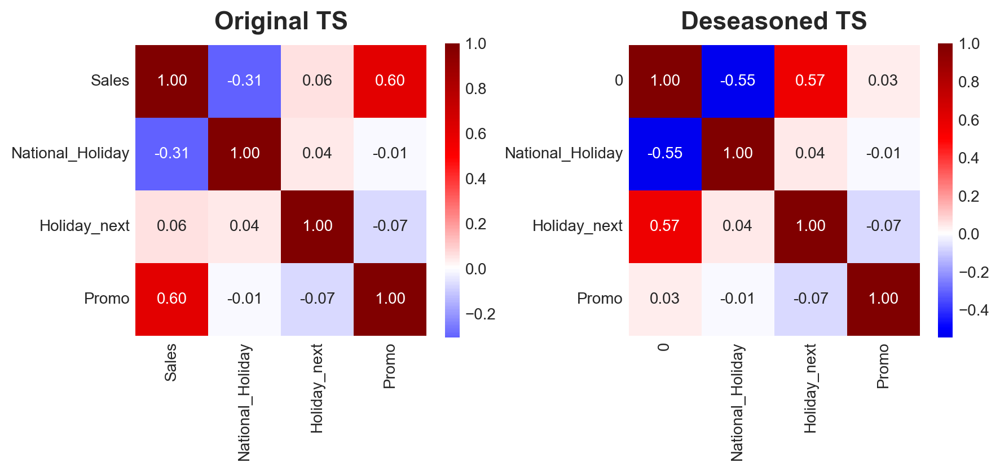

In [34]:
# Target and features' correlation heat maps
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(9,9))

new_features = pd.concat([holidays, 
                          hol_next_day,
                          promo_days,
                         ],axis = 1)

correlation = average_sales_DE.join(new_features).corr()
correlation2 = y_deseasoned.to_frame().join(new_features).corr()

sns.heatmap(correlation, cbar = True, cbar_kws={"shrink": 0.3},  square = True, annot=True, fmt= '.2f', annot_kws={'size': 10},
           cmap= 'seismic', center=0.00, ax=ax1).set_title('Original TS')

sns.heatmap(correlation2, cbar = True,  cbar_kws={"shrink": 0.3},  square = True, annot=True, fmt= '.2f', annot_kws={'size': 10},
           cmap= 'seismic', center=0.00, ax=ax2).set_title('Deseasoned TS')
plt.show()

In [35]:
X_mi = new_features
y_mi = y_deseasoned

# Label encoding for categoricals
for colname in X_mi.select_dtypes("object"):
    X_mi[colname], _ = X_mi[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X_mi.dtypes == int

mi_scores = make_mi_scores(X_mi, y_mi, discrete_features)
# X_mi.iloc[:,-3:]
mi_scores

Holiday_next       0.10
National_Holiday   0.10
Promo              0.09
Name: MI Scores, dtype: float64

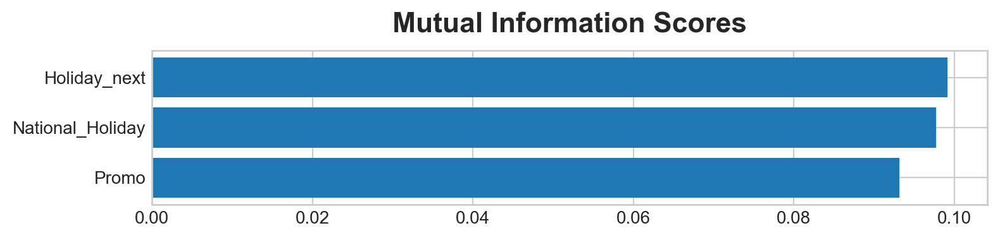

In [36]:
plt.figure(dpi=100, figsize=(8, 2))
plot_mi_scores(mi_scores)

In [37]:
# sns.relplot(x='Promo', y=0, data = y_deseasoned.to_frame().join(new_features),kind="line");

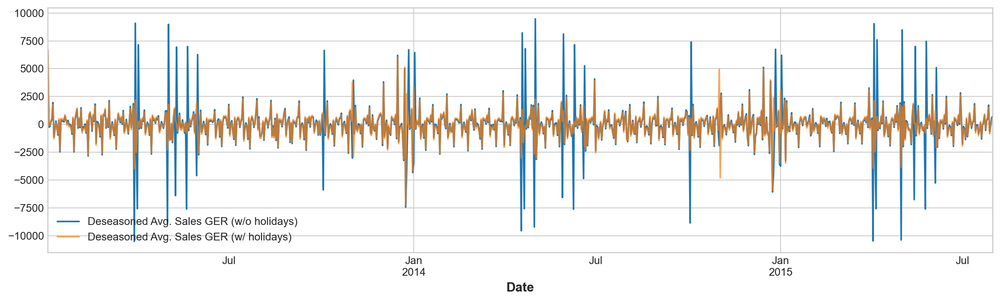

In [38]:
X = new_features
y = y_deseasoned

model = LinearRegression().fit(X, y)
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

y_deseasoned_2 = y - y_pred

y_deseasoned.plot(legend=True, label='Deseasoned Avg. Sales GER (w/o holidays)', figsize=(13, 4))
y_deseasoned_2.plot(legend=True, label='Deseasoned Avg. Sales GER (w/ holidays)', alpha=0.7);

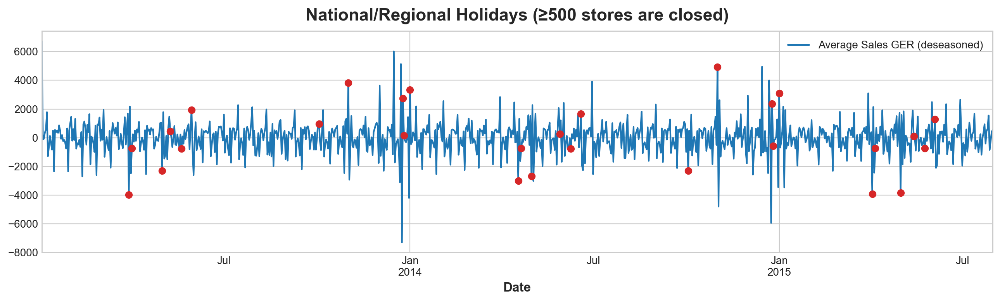

In [39]:
ax = y_deseasoned_2.plot(legend=True, label='Average Sales GER (deseasoned)', figsize=(13, 4))
plt.plot_date(national_holidays.index, y_deseasoned_2[national_holidays.index], color='C3')
ax.set_title('National/Regional Holidays (≥500 stores are closed)');

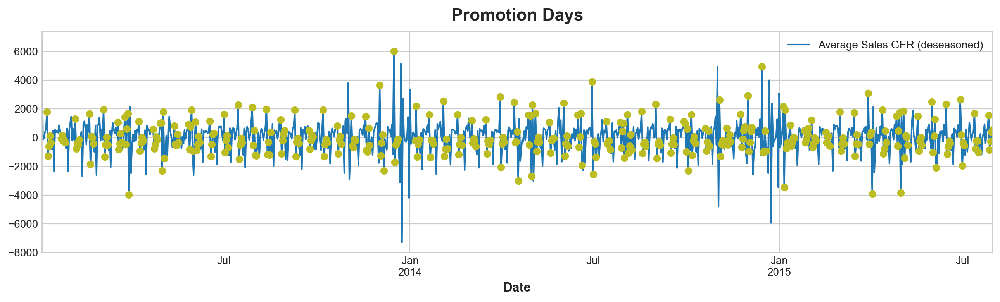

In [40]:
ax = y_deseasoned_2.plot(legend=True, label='Average Sales GER (deseasoned)', figsize=(13, 4))
plt.plot_date(promos.index, y_deseasoned_2[promos.index], color='C8')
ax.set_title('Promotion Days');

It looks like the remaining peaks are due to cyclic behaviour, especially around at the end of decembers.

Creating "lagged" copies of the series will help us to explore existence of serial dependence, i.e. cycles, by tackling reverse causality. Let's check PACF corrrelogram to see which `'lags'` would be helpful.\
One should not ignore that autocorrelation and partial autocorrelation are measures of *linear dependence*, so it will be beneficial to check lag plot to detect whether lags are *linear* or *non-linear* dependent.

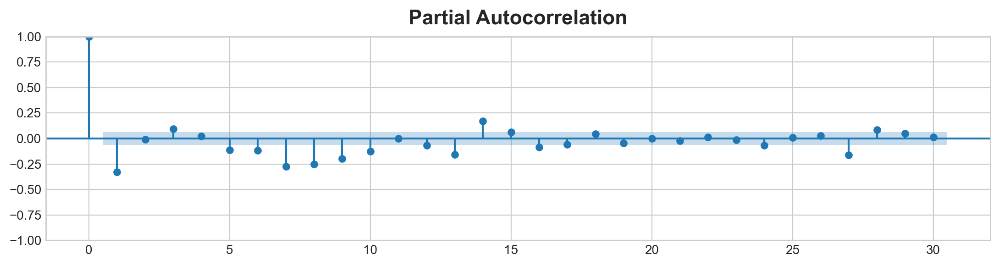

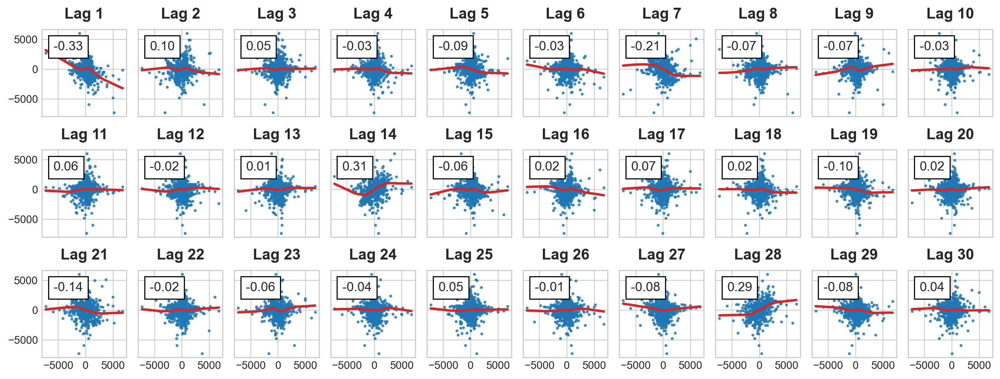

In [41]:
from tsa_plots import plot_lags

plot_pacf(y_deseasoned_2)
plot_lags(y_deseasoned_2, lags=30, nrows=3, figsize=(13,5));

PACF correlogram suggests us to use various lags in the first 15 ones, but 1st, 7th, 8th, and (maybe) 9th lags are comparatively/relevantly more significant than the rest.

Relationship between current average sales and past average sales are rather weak and looks like mostly non-linear

## 2.4 - Let's see some errors!

In [42]:
from utils import make_lags
lags = make_lags(y_deseasoned_2, 28).fillna(0)

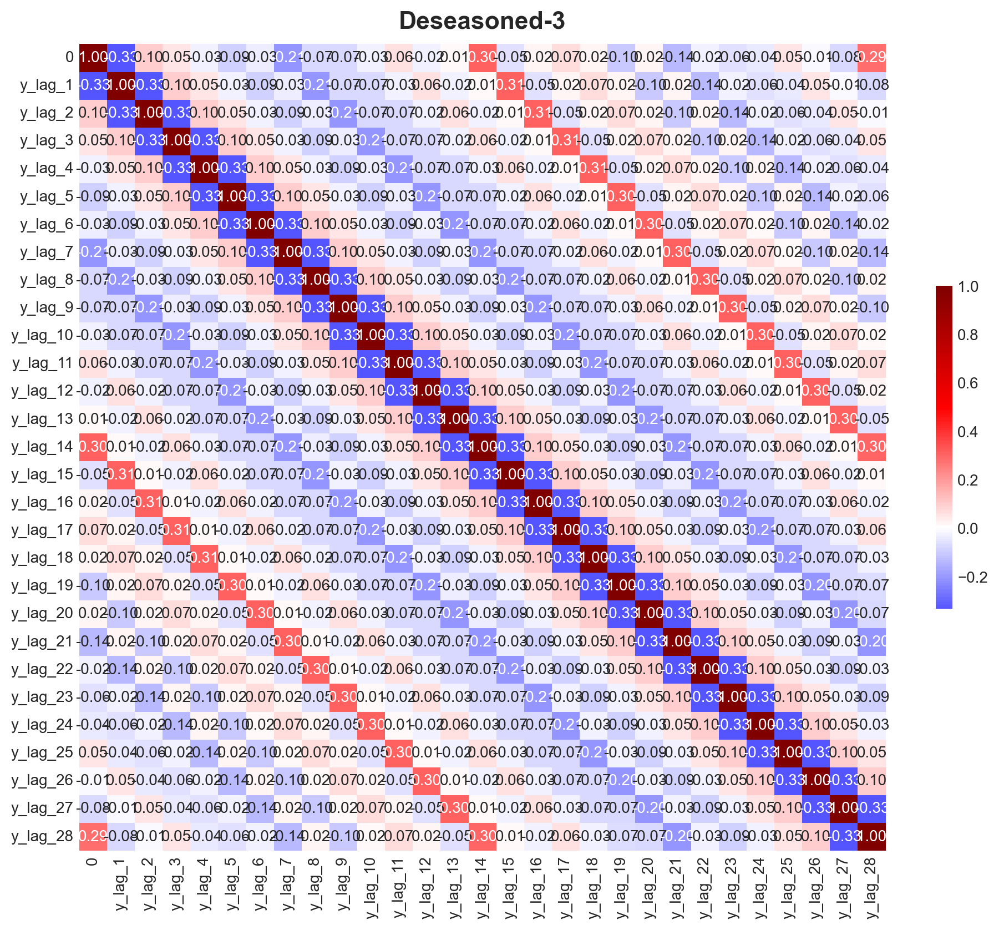

In [43]:
correlation = y_deseasoned_2.to_frame().join(lags).corr()

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(correlation, cbar = True, cbar_kws={"shrink": 0.3},  square = True, annot=True, fmt= '.2f', annot_kws={'size': 10},
           cmap= 'seismic', center=0.00, ).set_title('Deseasoned-3');

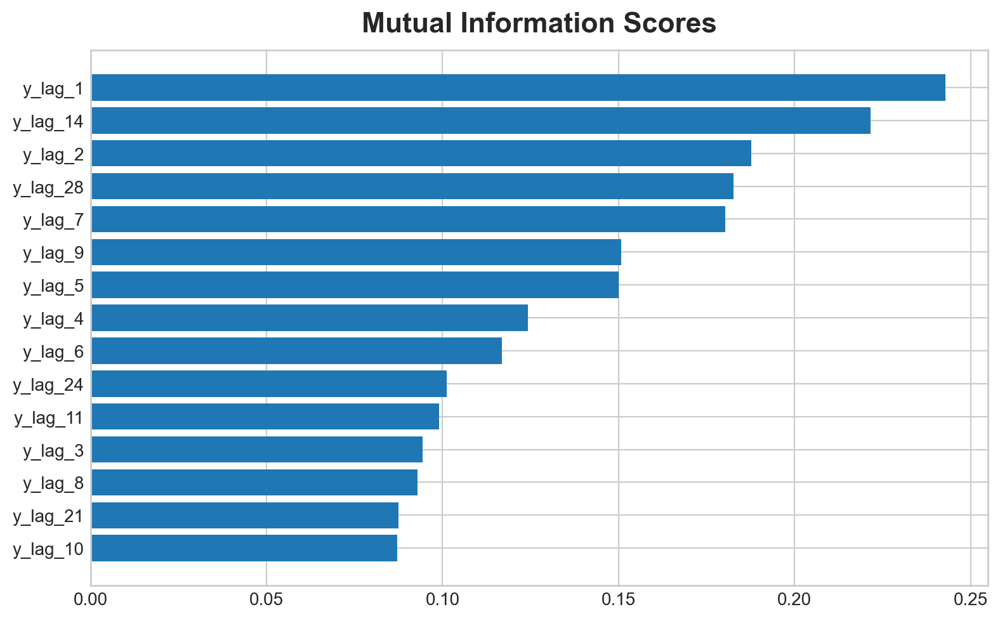

In [44]:
X_mi = lags

discrete_features = X_mi.dtypes == int

mi_scores = make_mi_scores(X_mi, y_deseasoned_2, discrete_features)

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores[:15])

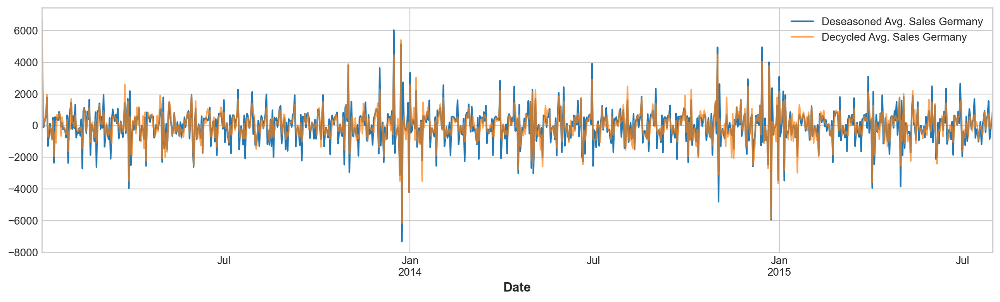

In [45]:
X = X_mi[['y_lag_1','y_lag_14','y_lag_2','y_lag_28','y_lag_7']]
y = y_deseasoned_2

model = LinearRegression().fit(X, y)
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

y_decycled = y - y_pred

y_deseasoned_2.plot(legend=True, label='Deseasoned Avg. Sales Germany', figsize=(13, 4))
y_decycled.plot(legend=True, label='Decycled Avg. Sales Germany', alpha=0.7);

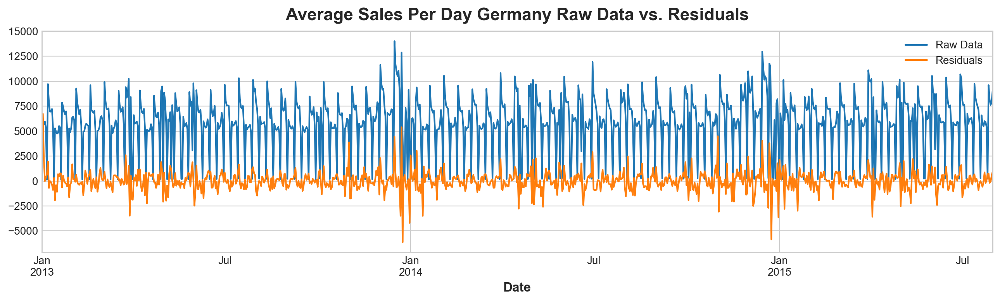

In [46]:
average_sales_DE['Sales'].plot(figsize=(13,4), legend = True, label= 'Raw Data', title="Average Sales Per Day Germany Raw Data vs. Residuals");
y_decycled.plot(legend = True, label= 'Residuals');

The first five suggestions from mutual information scores do a good job of removing the cycles.\
However, there is still room for improvement. Maybe a model more flexible than `LinearRegression` does the job better?

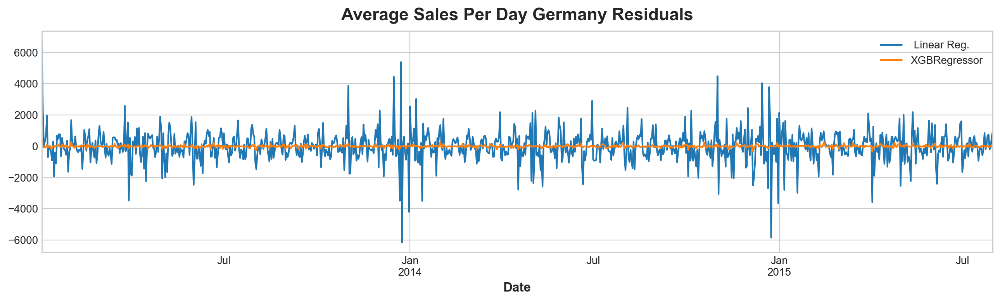

In [47]:
from xgboost import XGBRegressor

model = XGBRegressor().fit(X, y)
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

y_decycled_2 = y - y_pred


y_decycled.plot(legend=True, label=' Linear Reg.', figsize=(13, 4), title="Average Sales Per Day Germany Residuals")
y_decycled_2.plot(legend=True, label='XGBRegressor');

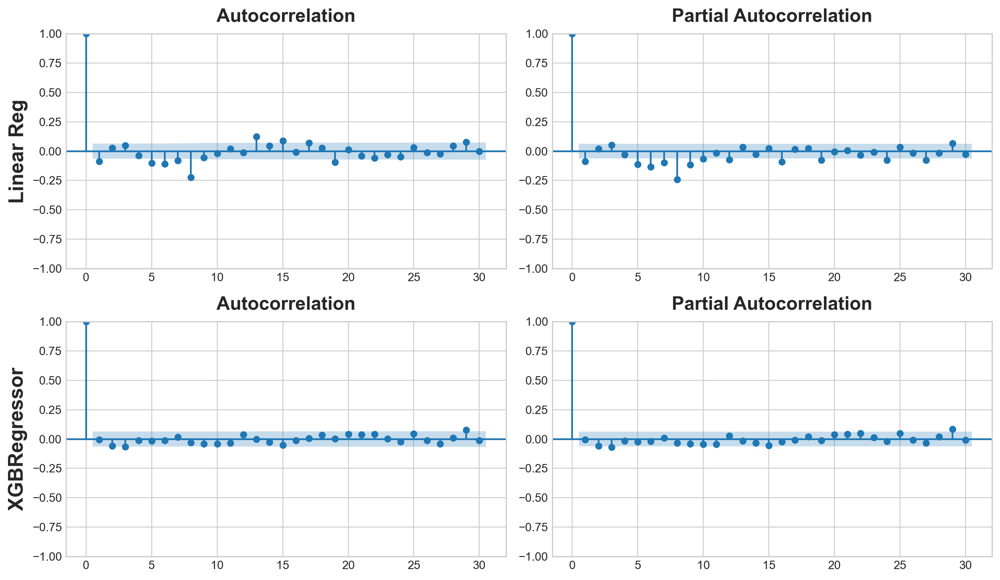

In [48]:
fig, ax = plt.subplots(2,2,figsize=(12,7))

plot_acf(y_decycled, lags=30, ax=ax[0,0])
plot_pacf(y_decycled, lags=30, ax=ax[0,1])
ax[0,0].set_ylabel('Linear Reg', fontsize='xx-large')
plot_acf(y_decycled_2, lags=30, ax=ax[1,0])
plot_pacf(y_decycled_2, lags=30, ax=ax[1,1])
ax[1,0].set_ylabel('XGBRegressor', fontsize='xx-large');

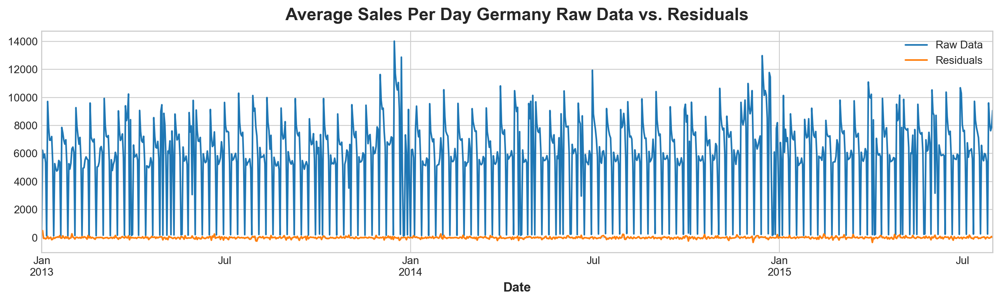

In [49]:
average_sales_DE['Sales'].plot(figsize=(13,4), legend = True, label= 'Raw Data', title="Average Sales Per Day Germany Raw Data vs. Residuals");
y_decycled_2.plot(legend = True, label= 'Residuals');

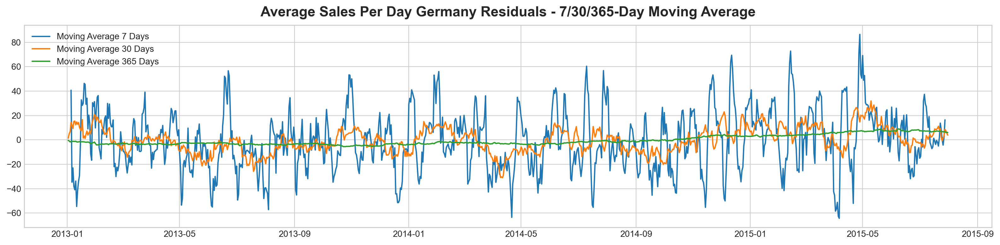

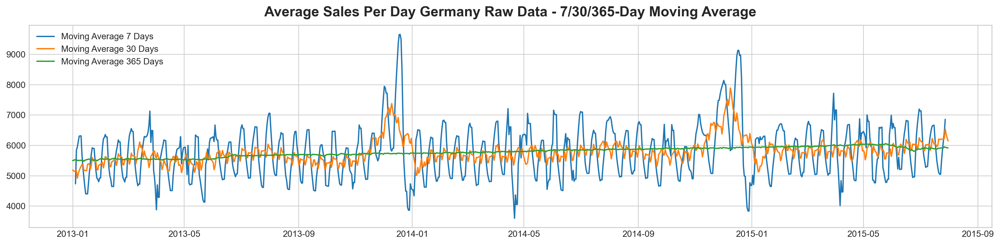

In [50]:
from tsa_plots import moving_avg_7_30_365_days_plots

moving_avg_7_30_365_days_plots(y_decycled_2, title='Average Sales Per Day Germany Residuals')
moving_avg_7_30_365_days_plots(average_sales_DE['Sales'], title='Average Sales Per Day Germany Raw Data')

## 2.4 - Initial findings

Our findings above show that our usual suspects, the trend, seasonality, and cyclic behaviour, exist in our time series. We have to consider this during predicting and forecasting average sales.

School holidays during summer and winter breaks would improve deseasoning, but they are excluded while investigating time series patterns in Germany-wide average sales.\
The underlying reason is that, particularly, the summer holidays are on a staggered schedule to avoid overburdening travel infrastructure through the 16 federal states.\
The earliest summer holidays begin in the middle of June, and the latest ones end in the middle of September.

These school holidays will be introduced during store-specific sale prediction.

What is left is now predicting the average sales and forecasting. The inferences above suggest using hybrid models to forecast.

# 3 - Predicting the store-specific sales

This section **will** include EDA of store-specific sales.